In [32]:
# Invoice training - making the training images after cropping main images

In [2]:
## To make all images of same size. Object boundary box selection to be done after this.

## i.e. after all images are of same size use VGG Image Annotation tool

In [1]:
import pandas as pd
import cv2
import os

from PIL import Image
import pytesseract
import cv2
import numpy as np

In [3]:
from tensorflow import keras
from keras import backend as K

#from Utils import *
from sklearn.model_selection import train_test_split
from keras.callbacks import ModelCheckpoint
from keras.optimizers import Adam
from keras.layers import *
#from keras.applications.mobilenetv2 import MobileNetV2
from keras.applications import MobileNetV2
import tensorflow as tf
from keras.models import Model
from keras.models import model_from_json
import matplotlib.pyplot as plt


In [4]:
# Making a list of image path

inv_directory = '/home/scar3crow/Downloads/INVOICES'  ## 'invoices' is a zip file of jpg images in ...../Downloads 
                                                        
inv_image = ['/home/scar3crow/Downloads/INVOICES/{}'.format(i) for i in os.listdir(inv_directory)] # making the list
inv_image.sort() # Sorting the list

len(inv_image)
inv_image[50]

'/home/scar3crow/Downloads/INVOICES/53.jpg'

In [5]:
inv_image

['/home/scar3crow/Downloads/INVOICES/1.jpg',
 '/home/scar3crow/Downloads/INVOICES/10.jpg',
 '/home/scar3crow/Downloads/INVOICES/11.jpg',
 '/home/scar3crow/Downloads/INVOICES/12.jpg',
 '/home/scar3crow/Downloads/INVOICES/13.jpg',
 '/home/scar3crow/Downloads/INVOICES/14.jpg',
 '/home/scar3crow/Downloads/INVOICES/15.jpg',
 '/home/scar3crow/Downloads/INVOICES/16.jpg',
 '/home/scar3crow/Downloads/INVOICES/17.jpg',
 '/home/scar3crow/Downloads/INVOICES/18.jpg',
 '/home/scar3crow/Downloads/INVOICES/19.jpg',
 '/home/scar3crow/Downloads/INVOICES/2.jpg',
 '/home/scar3crow/Downloads/INVOICES/20.jpg',
 '/home/scar3crow/Downloads/INVOICES/21.jpg',
 '/home/scar3crow/Downloads/INVOICES/22.jpg',
 '/home/scar3crow/Downloads/INVOICES/23.jpg',
 '/home/scar3crow/Downloads/INVOICES/24.jpg',
 '/home/scar3crow/Downloads/INVOICES/25.jpg',
 '/home/scar3crow/Downloads/INVOICES/26.jpg',
 '/home/scar3crow/Downloads/INVOICES/27.jpg',
 '/home/scar3crow/Downloads/INVOICES/28.jpg',
 '/home/scar3crow/Downloads/INVOICES

In [9]:
# Check sizes of exiting images :

rows = []
columns = []
image_sl = []
df = pd.DataFrame()

for i in range(len(inv_image)):
    image = cv2.imread(inv_image[i]) ## Loading image
    height, width, _ = image.shape
    rows.append(height)
    columns.append(width)
    image_sl.append(inv_image[i])
    
row_values = pd.Series(rows)
col_values = pd.Series(columns)
image_num = pd.Series(image_sl)


df.insert(loc=0, column='image_serial', value=image_num)
df.insert(loc=1, column='rows', value=row_values)
df.insert(loc=2, column='columns', value=col_values)

df.head()


,image_serial,rows,columns
0,/home/scar3crow/Downloads/INVOICES/1.jpg,768,554
1,/home/scar3crow/Downloads/INVOICES/10.jpg,768,554
2,/home/scar3crow/Downloads/INVOICES/11.jpg,768,554
3,/home/scar3crow/Downloads/INVOICES/12.jpg,768,554
4,/home/scar3crow/Downloads/INVOICES/13.jpg,768,554


In [10]:
# Finding minimimum sizes :

i = df[['rows']].idxmin()
j = df[['columns']].idxmin()

print(i)
print(j)

print(df.loc[i])
print(df.loc[j])

rows    0
dtype: int64
columns    0
dtype: int64
                               image_serial  rows  columns
0  /home/scar3crow/Downloads/INVOICES/1.jpg   768      554
                               image_serial  rows  columns
0  /home/scar3crow/Downloads/INVOICES/1.jpg   768      554


In [11]:
# Resize to 768 X 554

for i in range(len(df)):
    
    original_image = cv2.imread(df['image_serial'][i])
    resized_image = cv2.resize(original_image, (554, 768)) ## Note width(column), height(row) format in resize
    cv2.imwrite(df['image_serial'][i], resized_image) ## writting or over-writting on the old image

i_width = 554
i_height = 768

In [12]:
# Checking whether all images are now of same size

rows = []
columns = []
image_sl = []
df = pd.DataFrame()

for i in range(len(inv_image)):
    image = cv2.imread(inv_image[i]) ## Loading image
    height, width, _ = image.shape
    rows.append(height)
    columns.append(width)
    image_sl.append(inv_image[i])
    
row_values = pd.Series(rows)
col_values = pd.Series(columns)
image_num = pd.Series(image_sl)


df.insert(loc=0, column='image_serial', value=image_num)
df.insert(loc=1, column='rows', value=row_values)
df.insert(loc=2, column='columns', value=col_values)

df.head()

# Now, let's go for boundary box selection with VGG Image Annotation Tool

,image_serial,rows,columns
0,/home/scar3crow/Downloads/INVOICES/1.jpg,768,554
1,/home/scar3crow/Downloads/INVOICES/10.jpg,768,554
2,/home/scar3crow/Downloads/INVOICES/11.jpg,768,554
3,/home/scar3crow/Downloads/INVOICES/12.jpg,768,554
4,/home/scar3crow/Downloads/INVOICES/13.jpg,768,554


In [85]:
# Loading output of VGG Image Annotation tool and create a dataframe

r_data = pd.read_csv('/home/scar3crow/Downloads/invoice_data_1/via_region_data.csv')
num_obj = r_data['region_count'][0] # number of objects in each photo
r_data.drop(r_data.columns[[1, 2, 3, 4]], axis=1, inplace=True) # reduce unnecessary columns
r_data.sort_values(by=['#filename'], ascending=True) # Sorting based on image-id
num_images = r_data["#filename"].nunique() # Find out number of unique images

print('Number of classes = ', num_obj)
print('Number of unique images = ', num_images)
r_data.head()

Number of classes =  7
Number of unique images =  30


,#filename,region_shape_attributes,region_attributes
0,30.jpg,"{""name"":""rect"",""x"":91,""y"":125,""width"":394,""hei...","{""text"":""vendor""}"
1,30.jpg,"{""name"":""rect"",""x"":79,""y"":175,""width"":426,""hei...","{""text"":""buyer""}"
2,30.jpg,"{""name"":""rect"",""x"":38,""y"":83,""width"":136,""heig...","{""text"":""invoice""}"
3,30.jpg,"{""name"":""rect"",""x"":412,""y"":88,""width"":76,""heig...","{""text"":""inv_date""}"
4,30.jpg,"{""name"":""rect"",""x"":94,""y"":253,""width"":74,""heig...","{""text"":""po""}"


In [86]:
# Making a dataframe for Image_id, x, y, width, height and class

x = []
y = []
width = []
height = []
obj_class = []


for i in range(len(r_data)):
    
    r_size = r_data.values[i, 1][1:(len(r_data.values[i, 1])-1)]
    r_size_par = r_size.split(",")
    
    x.append(int("".join(filter(str.isdigit, r_size_par[1]))))
    y.append(int("".join(filter(str.isdigit, r_size_par[2]))))
    width.append(int("".join(filter(str.isdigit, r_size_par[3]))))
    height.append(int("".join(filter(str.isdigit, r_size_par[4]))))
    
    r_attribs = r_data.values[i, 2][1:(len(r_data.values[i, 2])-1)]
    r_attribs_par = r_attribs.split(':')[1]
    obj_class.append(r_attribs_par[1:(len(r_attribs_par)-1)])
    
x_values = pd.Series(x)
y_values = pd.Series(y)
width_values = pd.Series(width)
height_values = pd.Series(height)
class_values = pd.Series(obj_class)

r_data.insert(loc=1, column='x', value=x_values)
r_data.insert(loc=2, column='y', value=y_values)
r_data.insert(loc=3, column='width', value=width_values)
r_data.insert(loc=4, column='height', value=height_values)
r_data.insert(loc=5, column='obj_class', value=class_values)

r_data.insert(loc=8, column='image_width', value=i_width)
r_data.insert(loc=9, column='image_height', value=i_height)


r_data.drop(r_data.columns[[6, 7]], axis=1, inplace=True) # reduce unnecessary columns

r_data.rename({'#filename': 'img_id'}, axis=1, inplace=True) # changing column name

r_data.head()

,img_id,x,y,width,height,obj_class,image_width,image_height
0,30.jpg,91,125,394,45,vendor,554,768
1,30.jpg,79,175,426,81,buyer,554,768
2,30.jpg,38,83,136,26,invoice,554,768
3,30.jpg,412,88,76,23,inv_date,554,768
4,30.jpg,94,253,74,19,po,554,768


In [87]:
print('Number of unique images = ', r_data['img_id'].nunique())  # print total no, of unique images

print('Number of classes in diff. categories = ', r_data['obj_class'].value_counts()) 

image_list = r_data['img_id'].unique()

Number of unique images =  30
Number of classes in diff. categories =  buyer           30
inv_date        30
vendor          30
invoice         30
po              30
totals          29
item_detail     28
tem_detail       1
total            1
item_details     1
Name: obj_class, dtype: int64


In [88]:
image_list

array(['30.jpg', '8.jpg', '7.jpg', '6.jpg', '5.jpg', '4.jpg', '3.jpg',
       '29.jpg', '28.jpg', '27.jpg', '26.jpg', '25.jpg', '24.jpg',
       '23.jpg', '22.jpg', '21.jpg', '20.jpg', '19.jpg', '18.jpg',
       '17.jpg', '16.jpg', '2.jpg', '15.jpg', '14.jpg', '13.jpg',
       '12.jpg', '11.jpg', '10.jpg', '1.jpg', '9.jpg'], dtype=object)

In [52]:
# Correcting above wrong spelling of object classes and rechecking

id_1 = r_data.index[r_data['obj_class'] == 'tem_detail'] # Finding the index
id_2 = r_data.index[r_data['obj_class'] == 'total'] # Finding the index
id_3 = r_data.index[r_data['obj_class'] == 'item_details'] # Finding the index

r_data.at[id_1, 'obj_class'] = 'item_detail' # writing the correct spelling 
r_data.at[id_2, 'obj_class'] = 'totals' # # writing the correct spelling
r_data.at[id_3, 'obj_class'] = 'item_detail' # # writing the correct spelling

print('Number of unique images = ', r_data['img_id'].nunique())  # print total no, of unique images
print('Number of unique classes = ', r_data['obj_class'].nunique())
print('Number of classes in diff. categories = ', r_data['obj_class'].value_counts()) 


Number of unique images =  30
Number of unique classes =  7
Number of classes in diff. categories =  vendor         30
item_detail    30
totals         30
po             30
invoice        30
buyer          30
inv_date       30
Name: obj_class, dtype: int64


In [53]:
# Check whether all images have got same number of classes

r_data.groupby('img_id').img_id.count()

img_id
1.jpg     7
10.jpg    7
11.jpg    7
12.jpg    7
13.jpg    7
14.jpg    7
15.jpg    7
16.jpg    7
17.jpg    7
18.jpg    7
19.jpg    7
2.jpg     7
20.jpg    7
21.jpg    7
22.jpg    7
23.jpg    7
24.jpg    7
25.jpg    7
26.jpg    7
27.jpg    7
28.jpg    7
29.jpg    7
3.jpg     7
30.jpg    7
4.jpg     7
5.jpg     7
6.jpg     7
7.jpg     7
8.jpg     7
9.jpg     7
Name: img_id, dtype: int64

In [30]:
## Creating train images by cropping original images as per x, y, width, height of bbox created in VGG I.A. tool

my_class_image = [] # List of class images with proper id
kount = 0

for i in range(len(inv_image)):
    
    id = inv_image[i].split('/')[-1] # finding the image_id
    indices = r_data.index[r_data['img_id'] == id].tolist() # making the list of indices of r_data where same image_id exists
    
    if len(indices) != 0:
        
        image = cv2.imread(inv_image[i]) ## Loading image
    
        kount = kount + 1
        
        # Cropping, making a training image list and saving training images in 'train_invoice' folder
    
        for j in indices:
        
            image_crop = image[r_data['y'][j]:r_data['y'][j]+r_data['height'][j], r_data['x'][j]:r_data['x'][j]+r_data['width'][j]]
        
            class_sl_id = '/home/scar3crow/Downloads/train_invoice/' + id.split('.')[0] + '-' + str(r_data['obj_class'][j]) + str(kount) + '.jpg'
        
            my_class_image.append(class_sl_id)
            
            cv2.imwrite(class_sl_id, image_crop)

In [60]:
i_path = '/home/scar3crow/Downloads/INVOICES/' + r_data['img_id'][0]

i_mage = cv2.imread(i_path)
    
x_ratio = 512/i_mage.shape[1]
y_ratio = 512/i_mage.shape[0]

print(x_ratio, y_ratio)
print(i_mage.shape[1], i_mage.shape[0])

x = cv2.resize(i_mage,(512,512))

print(x.shape[1], x.shape[0])

0.924187725631769 0.6666666666666666
554 768
512 512


In [73]:
a = 0
b = 0

xmin = r_data['x'][0] * x_ratio
xmax = (r_data['x'][0] + r_data['width'][0]) * x_ratio
ymin = r_data['y'][0] * y_ratio
ymax = (r_data['y'][0] + r_data['height'][0]) * y_ratio

print(xmin, xmax, ymin, ymax)

img_w = 512
img_h = 512
grid_x_axis = 16
grid_y_axis = 16
Y = np.zeros((grid_y_axis, grid_x_axis,1, 5))

w = (xmax - xmin)/img_w
h = (ymax - ymin)/img_h

print(w, h)

a = ((xmax + xmin)/2)/img_w
b = ((ymax + ymin)/2)/img_h

print(a, b)

a = a * grid_x_axis
b = b * grid_y_axis

print(a, b)

Y[int(b),int(a),0,0] = 1
Y[int(b),int(a),0,1] = a - int(a)
Y[int(b),int(a),0,2] = b - int(b)
Y[int(b),int(a),0,3] = w
Y[int(b),int(a),0,4] = h

print(Y[3, 8, 0, 0])
print(Y[3, 8, 0, 1])
print(Y[3, 8, 0, 2])
print(Y[3, 8, 0, 3])
print(Y[3, 8, 0, 4])

84.10108303249098 448.23104693140795 83.33333333333333 113.33333333333333
0.7111913357400722 0.05859375
0.5198555956678701 0.19205729166666666
8.317689530685922 3.0729166666666665
1.0
0.31768953068592154
0.07291666666666652
0.7111913357400722
0.05859375


In [84]:
import tarfile
import numpy as np


import os
import tqdm
from scipy.io import loadmat
import matplotlib.pyplot as plt

In [91]:
image_path = '/home/scar3crow/Downloads/Data/images/'

gt_path = '/home/scar3crow/Downloads/Data/ground_truth/'

train_image_paths = []
train_gt_paths = []

for new_file in tqdm.tqdm(os.listdir(gt_path)):
    
    name_split = new_file.split('.')
    image_name = name_split[0][3:]
    image_name = image_name + '.jpg'
    
    if 'gt' in new_file:
        image_name = name_split[0][3:]
        image_name = image_name + '.jpg'
    
    path_img = os.path.join(image_path , image_name)
    train_image_paths.append(path_img)
    train_gt_paths.append(os.path.join(gt_path , new_file))



X_final = []
Y_final = []
grid_h = 16
grid_w = 16
img_w = 512
img_h = 512



for z in tqdm.tqdm(range(len(train_image_paths))):
    
    new_file = train_image_paths[z]
    #print(new_file)
    x = cv2.imread(train_image_paths[z])
    x_sl = 512/x.shape[1]
    y_sl = 512/x.shape[0]
    
    img = cv2.resize(x,(512,512))
    
    
    X_final.append(img)
    
    #plt.imshow(cv2.imread(new_file))
    #plt.show()
    
    i = " "
    
    if 'img' in new_file:
        i = ", "
    
    Y = np.zeros((grid_h,grid_w,1,5))
    
    file = train_gt_paths[z]
    name = open(file , 'r')
    data = name.read()
    data = data.split("\n")
    data = data[:-1]
    
    
    for li in data:
        temp_list = []
        file_data = li.split(i)
        strr = file_data[4]
        bb = file_data[:4]
        
        xmin = int(bb[0])*x_sl
        xmax = int(bb[2])*x_sl
        ymin = int(bb[1])*y_sl
        ymax = int(bb[3])*y_sl
        
        #te = cv2.rectangle(img,(int(xmin),int(ymin)),(int(xmax),int(ymax)) , color = (0,255,0))
        
        w = (xmax - xmin)/img_w
        h = (ymax - ymin)/img_h
        
        x = ((xmax + xmin)/2)/img_w
        y = ((ymax + ymin)/2)/img_h
        x = x * grid_w
        y = y * grid_h
        
        Y[int(y),int(x),0,0] = 1
        Y[int(y),int(x),0,1] = x - int(x)
        Y[int(y),int(x),0,2] = y - int(y)
        Y[int(y),int(x),0,3] = w
        Y[int(y),int(x),0,4] = h
        
    #plt.imshow(te)
    #plt.show()
    
    Y_final.append(Y)
    




X = np.array(X_final)
X_final = []
Y = np.array(Y_final)
Y_final = []

X = (X - 127.5)/127.5
###
# np.save('Data1/X.npy',X)
# np.save('Data1/Y.npy',Y)


100%|██████████| 461/461 [00:43<00:00, 10.53it/s]


In [95]:
image_path = '/home/scar3crow/Downloads/Data/images/'

gt_path = '/home/scar3crow/Downloads/Data/ground_truth/'

train_image_paths = []
train_gt_paths = []

for new_file in tqdm.tqdm(os.listdir(gt_path)):
    
    name_split = new_file.split('.')
    image_name = name_split[0][3:]
    image_name = image_name + '.jpg'
    
    if 'gt' in new_file:
        image_name = name_split[0][3:]
        image_name = image_name + '.jpg'
    
    path_img = os.path.join(image_path , image_name)
    train_image_paths.append(path_img)
    train_gt_paths.append(os.path.join(gt_path , new_file))

print(len(train_image_paths))

100%|██████████| 461/461 [00:00<00:00, 208922.11it/s]

461












  0%|          | 0/461 [00:00<?, ?it/s]

(167, 640, 3)


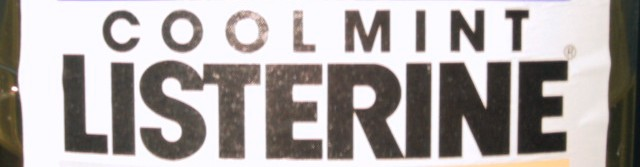

In [152]:
z = tqdm.tqdm(range(len(train_image_paths)))

x = cv2.imread(train_image_paths[0])

print(x.shape)    
x_pil = Image.fromarray(x)
display(x_pil) 

512


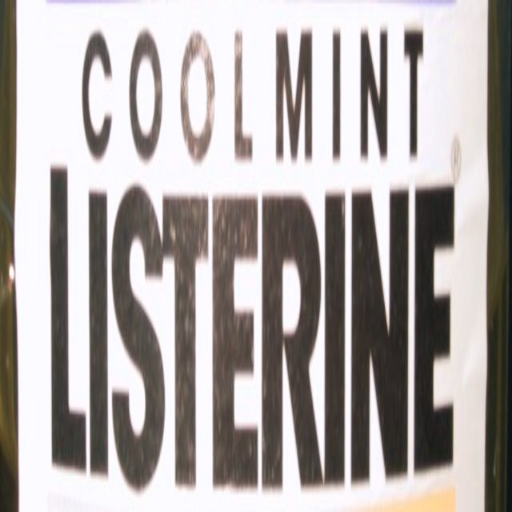

In [112]:
img = cv2.resize(x,(512,512))

print(img.shape[1])

img_pil = Image.fromarray(img)
display(img_pil)


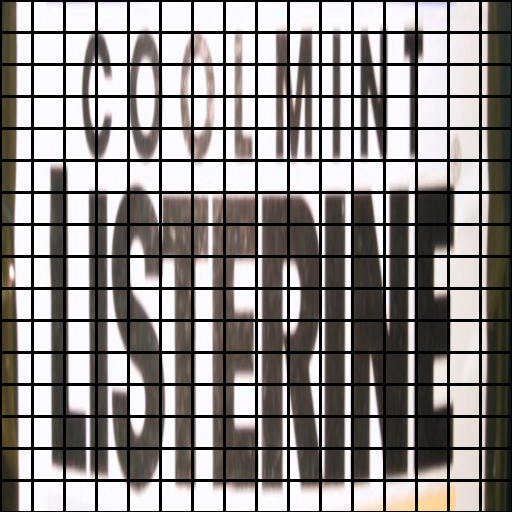

In [113]:
image_copy = img.copy()

m = int(512/16)
n = int(512/16)

x_range = [0, 32, 64, 96, 128, 160, 192, 224, 256, 288, 320, 352, 384, 416, 448, 480]
y_range = [0, 32, 64, 96, 128, 160, 192, 224, 256, 288, 320, 352, 384, 416, 448, 480]


for i in x_range:
    for j in y_range:
        cv2.rectangle(image_copy, (i, j), (i+32, j+32), 0, 2)
    
img_pil = Image.fromarray(image_copy)
display(img_pil)
    

63 54 567 160 "LISTERINE"
102 9 528 52 "COOLMINT"

['63 54 567 160 "LISTERINE"', '102 9 528 52 "COOLMINT"', '']
++++++++++++++++++++++++++++++
['63 54 567 160 "LISTERINE"', '102 9 528 52 "COOLMINT"']


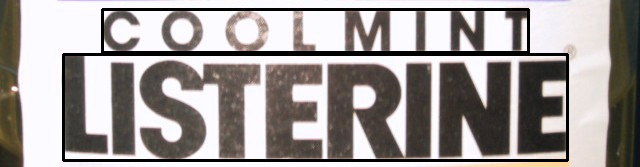

In [115]:
x_copy = x.copy()

file = train_gt_paths[0]
name = open(file , 'r')
data = name.read()
print(data)
print('==============================')
data = data.split("\n")
print(data)
print('++++++++++++++++++++++++++++++')
data = data[:-1]
print(data)

cv2.rectangle(x_copy, (63, 54), (567, 160), 0, 2)
cv2.rectangle(x_copy, (102, 9), (528,52), 0, 2)

x_copy_pil = Image.fromarray(x_copy)
display(x_copy_pil)


In [120]:
print(type(data))
print(data[0])
x.shape

<class 'list'>
63 54 567 160 "LISTERINE"


(167, 640, 3)

In [153]:
Y = np.zeros((grid_h,grid_w,1,5))

x_sl = 512/x.shape[1]
y_sl = 512/x.shape[0]

i = " "

for li in data:
    
    print(li)
    print(type(li))
    temp_list = []
    file_data = li.split(i)
    print(file_data)
    print(type(file_data))
    print('========================')
    strr = file_data[4]
    bb = file_data[:4]
    print(bb)
    print('++++++++++++++++++++++++++')
    xmin = int(bb[0])*x_sl
    xmax = int(bb[2])*x_sl
    ymin = int(bb[1])*y_sl
    ymax = int(bb[3])*y_sl
    print(xmin, ', ', ymin, ', ', xmax, ', ', ymax)
    print('***********************************')
    
    w = (xmax - xmin)/img_w
    h = (ymax - ymin)/img_h
        
    x = ((xmax + xmin)/2)/img_w
    y = ((ymax + ymin)/2)/img_h
    print('[[[ ', x, ', ', y, ']]]')
    x = x * grid_w
    y = y * grid_h
    print('[[[ ', x, ', ', y, ']]]')
        
    Y[int(y),int(x),0,0] = 1
    Y[int(y),int(x),0,1] = x - int(x)
    Y[int(y),int(x),0,2] = y - int(y)
    Y[int(y),int(x),0,3] = w
    Y[int(y),int(x),0,4] = h
    
    print(Y[10,7,0,1], Y[10, 7, 0, 2])
    print(Y[2, 7, 0, 1], Y[2, 7, 0, 2])
    print('$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$')

63 54 567 160 "LISTERINE"
<class 'str'>
['63', '54', '567', '160', '"LISTERINE"']
<class 'list'>
['63', '54', '567', '160']
++++++++++++++++++++++++++
50.400000000000006 ,  165.5568862275449 ,  453.6 ,  490.5389221556886
***********************************
[[[  0.4921875 ,  0.6407185628742516 ]]]
[[[  7.875 ,  10.251497005988025 ]]]
0.875 0.2514970059880248
0.0 0.0
$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
102 9 528 52 "COOLMINT"
<class 'str'>
['102', '9', '528', '52', '"COOLMINT"']
<class 'list'>
['102', '9', '528', '52']
++++++++++++++++++++++++++
81.60000000000001 ,  27.592814371257486 ,  422.40000000000003 ,  159.4251497005988
***********************************
[[[  0.49218750000000006 ,  0.18263473053892215 ]]]
[[[  7.875000000000001 ,  2.9221556886227544 ]]]
0.875 0.2514970059880248
0.8750000000000009 0.9221556886227544
$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$


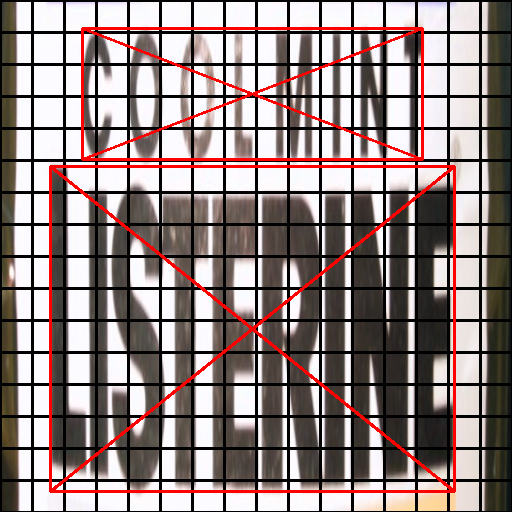

In [136]:
cv2.rectangle(image_copy, (50, 166), (454, 491), (255, 0, 0), 2)
cv2.rectangle(image_copy, (82, 28), (422, 159), (255, 0, 0), 2)

cv2.line(image_copy, (50,166), (454, 491), (255,0,0), 2)
cv2.line(image_copy, (50,491), (454, 166), (255,0,0), 2)

cv2.line(image_copy, (82, 28), (422, 159), (255,0,0), 2)
cv2.line(image_copy, (82,159), (422, 28), (255,0,0), 2)


image_copy_pil = Image.fromarray(image_copy)
display(image_copy_pil)


In [135]:
int(2.9)

2

In [ ]:
X_final = []
Y_final = []
grid_x_axis = 16
grid_y_axis = 16

img_w = 512
img_h = 512

for i in range(len(r_data)):

    i_path = '/home/scar3crow/Downloads/INVOICES/' + r_data[img_id][i]
    i_mage = cv2.imread(i_path)
    
    x_ratio = 512/i_mage.shape[1]
    y_ratio = 512/i_mage.shape[0]

    i_mage_resized = cv2.resize(i_mage,(512,512))
    
    X_final.append(i_mage_resized)
    Y = np.zeros((grid_y_axis, grid_x_axis,3, 12))  # 3 nos. Anchor Boxes, (1 + 4 + 7 classes)
    
    xmin = r_data['x'][i] * x_ratio
    xmax = (r_data['x'][i] + r_data['width'][i]) * x_ratio
    ymin = r_data['y'][i] * y_ratio
    ymax = (r_data['y'][i] + r_data['height'][i]) * y_ratio
    
    w = (xmax - xmin)/img_w
    h = (ymax - ymin)/img_h
        
    a = ((xmax + xmin)/2)/img_w
    b = ((ymax + ymin)/2)/img_h
    a = a * grid_x_axis
    b = b * grid_y_axis
        
    Y[int(b),int(a),0,0] = 1
    Y[int(y),int(x),0,1] = x - int(x)
    Y[int(y),int(x),0,2] = y - int(y)
    Y[int(y),int(x),0,3] = w
    Y[int(y),int(x),0,4] = h

    
    
    
    


(1200, 1600, 3)


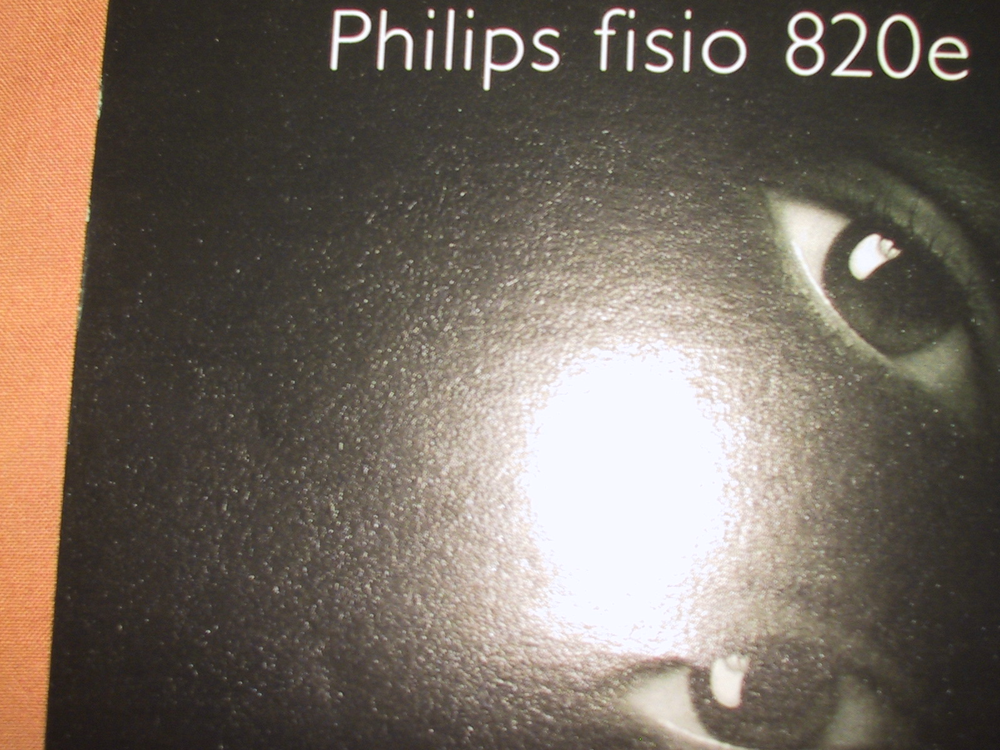

In [191]:
x = cv2.imread(train_image_paths[1])

print(x.shape)    
x_pil = Image.fromarray(x)
display(x_pil) 

512


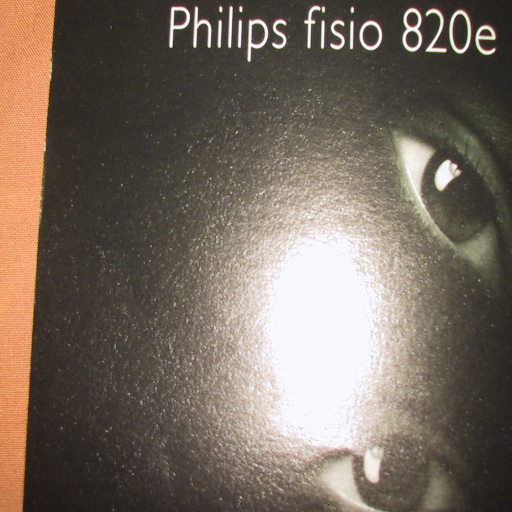

In [192]:
img = cv2.resize(x,(512,512))

print(img.shape[1])

img_pil = Image.fromarray(img)
display(img_pil)


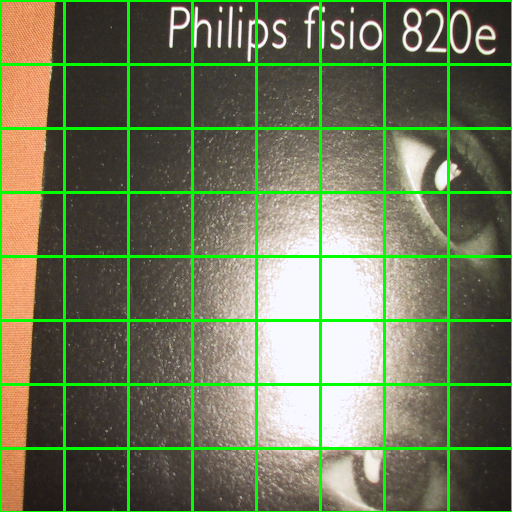

In [193]:
image_copy = img.copy()


X_final = []
Y_final = []
grid_h = 8
grid_w = 8
img_w = 512
img_h = 512


m = int(512/8)
n = int(512/8)

x_range = [0, 64, 128, 192, 256, 320, 384, 448]
y_range = [0, 64, 128, 192, 256, 320, 384, 448]


for i in x_range:
    for j in y_range:
        cv2.rectangle(image_copy, (i, j), (i+64, j+64), (0, 255, 0), 2)
    
img_pil = Image.fromarray(image_copy)
display(img_pil)


528 13 895 145 "Philips"
950 13 1193 117 "fisio"
1258 19 1549 128 "820e"

['528 13 895 145 "Philips"', '950 13 1193 117 "fisio"', '1258 19 1549 128 "820e"', '']
++++++++++++++++++++++++++++++
['528 13 895 145 "Philips"', '950 13 1193 117 "fisio"', '1258 19 1549 128 "820e"']


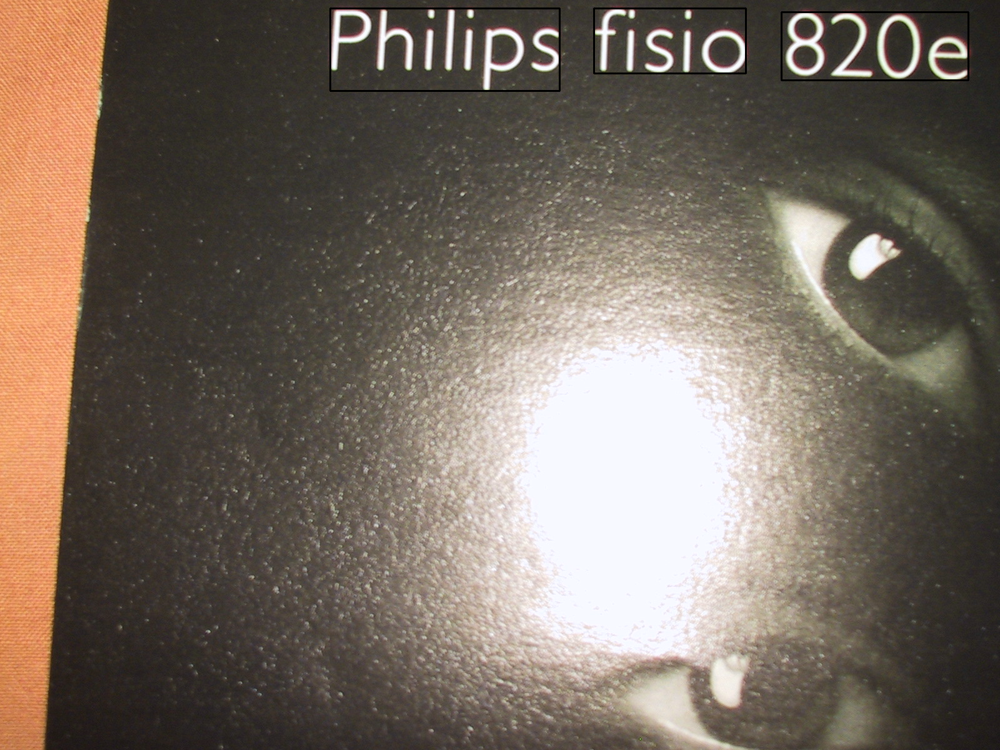

In [194]:
x_copy = x.copy()

file = train_gt_paths[1]
name = open(file , 'r')
data = name.read()
print(data)
print('==============================')
data = data.split("\n")
print(data)
print('++++++++++++++++++++++++++++++')
data = data[:-1]
print(data)

cv2.rectangle(x_copy, (528, 13), (895, 145), 0, 2)
cv2.rectangle(x_copy, (950, 13), (1193,117), 0, 2)
cv2.rectangle(x_copy, (1250, 19), (1549,128), 0, 2)

x_copy_pil = Image.fromarray(x_copy)
display(x_copy_pil)


In [202]:
x = cv2.imread(train_image_paths[1])

Y = np.zeros((grid_h,grid_w,1,5))

x_sl = 512/x.shape[1]
y_sl = 512/x.shape[0]

i = " "

for li in data:
    
    print(li)
    print(type(li))
    temp_list = []
    file_data = li.split(i)
    print(file_data)
    print(type(file_data))
    print('========================')
    strr = file_data[4]
    bb = file_data[:4]
    print(bb)
    print('++++++++++++++++++++++++++')
    xmin = int(bb[0])*x_sl
    xmax = int(bb[2])*x_sl
    ymin = int(bb[1])*y_sl
    ymax = int(bb[3])*y_sl
    print(xmin, ', ', ymin, ', ', xmax, ', ', ymax)
    print('***********************************')
    
    w = (xmax - xmin)/img_w
    h = (ymax - ymin)/img_h
        
    x = (xmin + (xmax-xmin)/2)/img_w
    y = (ymin + (ymax-ymin)/2)/img_h
    print('[[[ ', x, ', ', y, ']]]')
    x = x * grid_w
    y = y * grid_h
    print('[[[ ', x, ', ', y, ']]]')
        
    Y[int(y),int(x),0,0] = 1
    
    Y[int(y),int(x),0,1] = x - int(x)
    Y[int(y),int(x),0,2] = y - int(y)
    Y[int(y),int(x),0,3] = w
    Y[int(y),int(x),0,4] = h
    
    print(Y[0, 3, 0, 1], Y[0, 3, 0, 2])
    print(Y[0, 5, 0, 1], Y[0, 5, 0, 2])
    print(Y[0, 7, 0, 1], Y[0, 7, 0, 2])
    print('$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$')


528 13 895 145 "Philips"
<class 'str'>
['528', '13', '895', '145', '"Philips"']
<class 'list'>
['528', '13', '895', '145']
++++++++++++++++++++++++++
168.96 ,  5.546666666666667 ,  286.40000000000003 ,  61.86666666666667
***********************************
[[[  0.4446875 ,  0.06583333333333333 ]]]
[[[  3.5575 ,  0.5266666666666666 ]]]
0.5575000000000001 0.5266666666666666
0.0 0.0
0.0 0.0
$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
950 13 1193 117 "fisio"
<class 'str'>
['950', '13', '1193', '117', '"fisio"']
<class 'list'>
['950', '13', '1193', '117']
++++++++++++++++++++++++++
304.0 ,  5.546666666666667 ,  381.76 ,  49.92
***********************************
[[[  0.6696875 ,  0.05416666666666667 ]]]
[[[  5.3575 ,  0.43333333333333335 ]]]
0.5575000000000001 0.5266666666666666
0.35749999999999993 0.43333333333333335
0.0 0.0
$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
1258 19 1549 128 "820e"
<class 'str'>
['1258', '19', '1549', '128', '"820e"']
<class 'list'>
['1258', '19', '1549', '128']


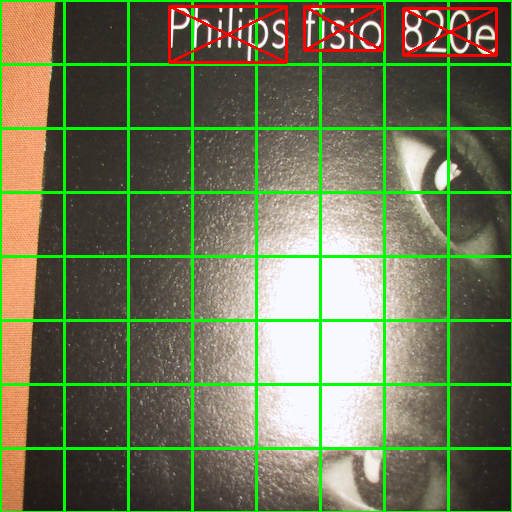

In [199]:
cv2.rectangle(image_copy, (169, 6), (286, 62), (255,0,0), 2)
cv2.rectangle(image_copy, (304, 6), (382, 50), (255, 0, 0), 2)
cv2.rectangle(image_copy, (403, 8), (496, 55), (255, 0, 0), 2)

cv2.line(image_copy,  (169, 6), (286, 62), (255,0,0), 2)
cv2.line(image_copy, (169, 62), (286, 6), (255,0,0), 2)


cv2.line(image_copy, (304, 6), (382, 50), (255,0,0), 2)
cv2.line(image_copy, (304, 50), (382, 6), (255,0,0), 2)

cv2.line(image_copy, (403, 8), (496, 55), (255,0,0), 2)
cv2.line(image_copy, (403, 55), (496, 8), (255,0,0), 2)


image_copy_pil = Image.fromarray(image_copy)
display(image_copy_pil)


In [185]:
q = 0.866
print(int(q))
print(int(q))

0
0


In [12]:
def yolo_model(input_shape):
    
    
    inp = Input(input_shape)
   
    model = MobileNetV2( input_tensor= inp , include_top=False, weights='imagenet')
    last_layer = model.output
    
    conv = Conv2D(512,(3,3) , activation='relu' , padding='same')(last_layer)
    conv = Dropout(0.4)(conv)
    bn = BatchNormalization()(conv)
    lr = LeakyReLU(alpha=0.1)(bn)
    
    
    conv = Conv2D(128,(5,5) , activation='relu' , padding='same')(lr)
    conv = Dropout(0.4)(conv)
    bn = BatchNormalization()(conv)
    lr = LeakyReLU(alpha=0.1)(bn)
    
    
    conv = Conv2D(12,(3,3) , activation='relu' , padding='same')(lr)
    
    final = Reshape((grid_h,grid_w,anchors,info))(conv)
    
    model = Model(inp,final)
    
    return model


In [7]:
# Variable Definition

img_w = 512
img_h = 512
channels = 3
anchors = 1
classes = 7 # vendor, buyer, invoice, inv_date, po, item, totals
info = 5 + classes    # pc, x, y, h, w, and class probabilities
grid_w = 16
grid_h = 16


In [13]:
input_size = (img_h,img_w,channels)

test_1_model = yolo_model(input_size)

test_1_model.summary()


/home/scar3crow/Dropbox/WorkStation-Subrata/python/venv1/lib/python3.5/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


9412608/9406464 [==============================] - 20s 2us/step
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 513, 513, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 256, 256, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 256, 256, 32) 128         Conv1[0][0]                      
____________________________

In [13]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

In [14]:
categories = ['vendor', 'buyer', 'invoice', 'invdate', 'po', 'item', 'totals']

values = np.array(categories)

#OneHotEncoder(categories='categories')

In [15]:
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(values)

categories_1 = sorted(categories)
print(categories_1)

onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
print(onehot_encoded)

## This first convert list to as-per-dictionary list. First word gets '1' in '0'th place, 2nd word in '1'st place,
## 3rd word in '2' place and so on.Then make the array row-wise for each word as per original list. Example:
## In our original list 'vendor' is in '0'th place. Hoever since 'vendor' is the last word, dictionary-wise, among
## all words in the list, it gets '1' in the last place i.e. [0 0 0 0 0 0 1] and then it gets the '0'th row in the
## resulting array

['buyer', 'invdate', 'invoice', 'item', 'po', 'totals', 'vendor']
[[0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0.]]


In [16]:
my_list = np.argmax(onehot_encoded, axis = 1)
my_list

array([6, 0, 2, 1, 4, 3, 5])

In [19]:
np.argmax(onehot_encoded[0, :])

6

In [18]:
categories[6]

'totals'

In [20]:
class_index = np.argmax(onehot_encoded[0, :])
#obj_class = sorted(categories.tolist())[class_index]
obj_class = sorted(categories)[class_index]
obj_class

'vendor'